# Convolutional Neural Networks

## Project: Write an Algorithm for a Dog Identification App 

---

In this notebook, some template code has already been provided for you, and you will need to implement additional functionality to successfully complete this project. You will not need to modify the included code beyond what is requested. Sections that begin with **'(IMPLEMENTATION)'** in the header indicate that the following block of code will require additional functionality which you must provide. Instructions will be provided for each section, and the specifics of the implementation are marked in the code block with a 'TODO' statement. Please be sure to read the instructions carefully! 

> **Note**: Once you have completed all of the code implementations, you need to finalize your work by exporting the Jupyter Notebook as an HTML document. Before exporting the notebook to html, all of the code cells need to have been run so that reviewers can see the final implementation and output. You can then export the notebook by using the menu above and navigating to **File -> Download as -> HTML (.html)**. Include the finished document along with this notebook as your submission.

In addition to implementing code, there will be questions that you must answer which relate to the project and your implementation. Each section where you will answer a question is preceded by a **'Question X'** header. Carefully read each question and provide thorough answers in the following text boxes that begin with **'Answer:'**. Your project submission will be evaluated based on your answers to each of the questions and the implementation you provide.

>**Note:** Code and Markdown cells can be executed using the **Shift + Enter** keyboard shortcut.  Markdown cells can be edited by double-clicking the cell to enter edit mode.

The rubric contains _optional_ "Stand Out Suggestions" for enhancing the project beyond the minimum requirements. If you decide to pursue the "Stand Out Suggestions", you should include the code in this Jupyter notebook.



---
### Why We're Here 

In this notebook, you will make the first steps towards developing an algorithm that could be used as part of a mobile or web app.  At the end of this project, your code will accept any user-supplied image as input.  If a dog is detected in the image, it will provide an estimate of the dog's breed.  If a human is detected, it will provide an estimate of the dog breed that is most resembling.  The image below displays potential sample output of your finished project (... but we expect that each student's algorithm will behave differently!). 

![Sample Dog Output](images/sample_dog_output.png)

In this real-world setting, you will need to piece together a series of models to perform different tasks; for instance, the algorithm that detects humans in an image will be different from the CNN that infers dog breed.  There are many points of possible failure, and no perfect algorithm exists.  Your imperfect solution will nonetheless create a fun user experience!

### The Road Ahead

We break the notebook into separate steps.  Feel free to use the links below to navigate the notebook.

* [Step 0](#step0): Import Datasets
* [Step 1](#step1): Detect Humans
* [Step 2](#step2): Detect Dogs
* [Step 3](#step3): Create a CNN to Classify Dog Breeds (from Scratch)
* [Step 4](#step4): Create a CNN to Classify Dog Breeds (using Transfer Learning)
* [Step 5](#step5): Write your Algorithm
* [Step 6](#step6): Test Your Algorithm

---
<a id='step0'></a>
## Step 0: Import Datasets

Make sure that you've downloaded the required human and dog datasets:
* Download the [dog dataset](https://s3-us-west-1.amazonaws.com/udacity-aind/dog-project/dogImages.zip).  Unzip the folder and place it in this project's home directory, at the location `/dogImages`. 

* Download the [human dataset](https://s3-us-west-1.amazonaws.com/udacity-aind/dog-project/lfw.zip).  Unzip the folder and place it in the home diretcory, at location `/lfw`.  

*Note: If you are using a Windows machine, you are encouraged to use [7zip](http://www.7-zip.org/) to extract the folder.*

In the code cell below, we save the file paths for both the human (LFW) dataset and dog dataset in the numpy arrays `human_files` and `dog_files`.

In [1]:
import numpy as np
from glob import glob

# load filenames for human and dog images
human_files = np.array(glob("lfw/*/*/*.jpg"))
dog_files = np.array(glob("dogImages/*/*/*/*.jpg"))

# print number of images in each dataset
print('There are %d total human images.' % len(human_files))
print('There are %d total dog images.' % len(dog_files))

There are 13233 total human images.
There are 0 total dog images.


<a id='step1'></a>
## Step 1: Detect Humans

In this section, we use OpenCV's implementation of [Haar feature-based cascade classifiers](http://docs.opencv.org/trunk/d7/d8b/tutorial_py_face_detection.html) to detect human faces in images.  

OpenCV provides many pre-trained face detectors, stored as XML files on [github](https://github.com/opencv/opencv/tree/master/data/haarcascades).  We have downloaded one of these detectors and stored it in the `haarcascades` directory.  In the next code cell, we demonstrate how to use this detector to find human faces in a sample image.

Number of faces detected: 1


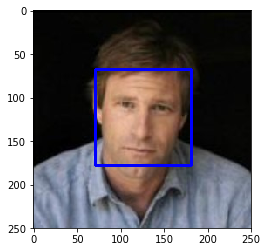

In [2]:
import cv2
import matplotlib.pyplot as plt                        
%matplotlib inline                               

# extract pre-trained face detector
face_cascade = cv2.CascadeClassifier('haarcascades/haarcascade_frontalface_alt.xml')

# load color (BGR) image
img = cv2.imread(human_files[0])

# convert BGR image to grayscale
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# find faces in image
faces = face_cascade.detectMultiScale(gray)

# print number of faces detected in the image
print('Number of faces detected:', len(faces))

# get bounding box for each detected face
for (x,y,w,h) in faces:
    # add bounding box to color image
    cv2.rectangle(img,(x,y),(x+w,y+h),(255,0,0),2)
    
# convert BGR image to RGB for plotting
cv_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# display the image, along with bounding box
plt.imshow(cv_rgb)
plt.show()

Before using any of the face detectors, it is standard procedure to convert the images to grayscale.  The `detectMultiScale` function executes the classifier stored in `face_cascade` and takes the grayscale image as a parameter.  

In the above code, `faces` is a numpy array of detected faces, where each row corresponds to a detected face.  Each detected face is a 1D array with four entries that specifies the bounding box of the detected face.  The first two entries in the array (extracted in the above code as `x` and `y`) specify the horizontal and vertical positions of the top left corner of the bounding box.  The last two entries in the array (extracted here as `w` and `h`) specify the width and height of the box.

### Write a Human Face Detector

We can use this procedure to write a function that returns `True` if a human face is detected in an image and `False` otherwise.  This function, aptly named `face_detector`, takes a string-valued file path to an image as input and appears in the code block below.

In [3]:
# returns "True" if face is detected in image stored at img_path
def face_detector(img_path):
    img = cv2.imread(img_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    faces = face_cascade.detectMultiScale(gray)
    return len(faces) > 0

### (IMPLEMENTATION) Assess the Human Face Detector

__Question 1:__ Use the code cell below to test the performance of the `face_detector` function.  
- What percentage of the first 100 images in `human_files` have a detected human face?  
- What percentage of the first 100 images in `dog_files` have a detected human face? 

Ideally, we would like 100% of human images with a detected face and 0% of dog images with a detected face.  You will see that our algorithm falls short of this goal, but still gives acceptable performance.  We extract the file paths for the first 100 images from each of the datasets and store them in the numpy arrays `human_files_short` and `dog_files_short`.

__Answer:__ 
(You can print out your results and/or write your percentages in this cell)

In [4]:
from tqdm import tqdm

human_files_short = human_files[:100]
dog_files_short = dog_files[:100]
#-#-# Do NOT modify the code above this line. #-#-#

## TODO: Test the performance of the face_detector algorithm 
## on the images in human_files_short and dog_files_short.
# for human_file in human_files_short:
human_as_human = 0
dog_as_human = 0
for h in tqdm(range(len(human_files_short)), ascii=True):
    if face_detector(human_files_short[h]):
        human_as_human += 1
human_pct = human_as_human / 100

for d in tqdm(range(len(dog_files_short)), ascii=True):
    if face_detector(dog_files_short[d]):
        dog_as_human += 1
dog_pct = dog_as_human / 100
print(f'Human detected as human: {human_pct * 100}%')   
print(f'Dog detected as human: {dog_pct * 100}%')

100%|###########################################################################| 100/100 [00:01<00:00, 66.88it/s]
0it [00:00, ?it/s]


Human detected as human: 96.0%
Dog detected as human: 0.0%


We suggest the face detector from OpenCV as a potential way to detect human images in your algorithm, but you are free to explore other approaches, especially approaches that make use of deep learning :).  Please use the code cell below to design and test your own face detection algorithm.  If you decide to pursue this _optional_ task, report performance on `human_files_short` and `dog_files_short`.

###### Optional task
Using CNN to detect human face.

The shape of images in the dataset is (3, 224, 224), while in dog dataset the shape varies.

In [5]:
import torch
import torch.nn as nn
import torch.nn.functional as F

# Define NN architecture to distinguish human and dog
class HumanFaceDetector(nn.Module):
    def __init__(self):
        super().__init__()
        # convolutional layers
        self.conv1 = nn.Conv2d(3, 16, 3, stride=1, padding=1)
        self.conv2 = nn.Conv2d(16, 32, 3, stride=1, padding=1)
        self.conv3 = nn.Conv2d(32, 64, 3, stride=1, padding=1)
        self.conv4 = nn.Conv2d(64, 128, 3, stride=1, padding=1)
        self.conv5 = nn.Conv2d(128, 256, 3, stride=1, padding=1)

        # max pooling layer
        self.pool = nn.MaxPool2d(2, 2)
        
        # dropout layer
        self.dropout = nn.Dropout(0.4)
        
        # batch normalization layer
        self.conv_bn1 = nn.BatchNorm2d(16)
        self.conv_bn2 = nn.BatchNorm2d(32)
        self.conv_bn3 = nn.BatchNorm2d(64)
        self.conv_bn4 = nn.BatchNorm2d(128)
        self.conv_bn5 = nn.BatchNorm2d(256)
        
        # fully connected layer
        self.fc1 = nn.Linear(7 * 7 * 256, 512)
        self.fc2 = nn.Linear(512, 256)
        self.fc3 = nn.Linear(256, 64)
        self.fc4 = nn.Linear(64, 2)

        
    def forward(self, x):
        # add sequence of convolutional and max pooling layers
        x = self.pool(F.relu(self.conv1(x)))
        x = self.conv_bn1(x)
        x = self.pool(F.relu(self.conv2(x)))
        x = self.conv_bn2(x)
        x = self.pool(F.relu(self.conv3(x)))
        x = self.conv_bn3(x)
        x = self.pool(F.relu(self.conv4(x)))
        x = self.conv_bn4(x)
        x = self.pool(F.relu(self.conv5(x)))
        x = self.conv_bn5(x)
        
        # flatten image input
        x = x.view(-1, 256 * 7 * 7)        
        # add dropout layer
        x = self.dropout(x)
        x = F.relu(self.fc1(x))
        x = self.dropout(x)
        x = F.relu(self.fc2(x))
        x = self.dropout(x)
        x = F.relu(self.fc3(x))
        x = self.fc4(x)
        return x
    
# initialize the NN
hfdetector = HumanFaceDetector()
print(hfdetector)
if torch.cuda.is_available():
    hfdetector = hfdetector.cuda()

HumanFaceDetector(
  (conv1): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv3): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv4): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv5): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (dropout): Dropout(p=0.4)
  (conv_bn1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv_bn2): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv_bn3): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv_bn4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv_bn5): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (fc1): 

In [6]:
# image preprocessing function
from PIL import Image

def shrink_large_img(img_path):
    bad_file_list = []
    with Image.open(img_path) as img:
        if min(img.size) > 512:
            try:
                print(f'File {img_path} shrinked!')
                img.thumbnail((275, 275))
                img.save(img_path, 'JPEG')
            except OSError as e:
                print(f'Bad image: {img_path}')
                bad_file_list.append(img_path)
    for file in bad_file_list:
        os.remove(file)
        print(f'{file} is bad and removed!')

Create dataset for human and dog:

In [7]:
# create dataset for human and dog (Could this setting result in overfitting?)
# only run first time
import os
import shutil
from random import shuffle

def createFolder(directory):
    try:
        if not os.path.exists(directory):
            os.makedirs(directory)
    except OSError:
        print ('Error: Creating directory. ' +  directory)

# create image folders
createFolder('cnn_dataset/train/human')
createFolder('cnn_dataset/valid/human')
createFolder('cnn_dataset/test/human')
createFolder('cnn_dataset/train/dog')
createFolder('cnn_dataset/valid/dog')
createFolder('cnn_dataset/test/dog')

# copy images to above folders
# train : validate : test = 6 : 2 : 2
human_files, dog_files = list(human_files), list(dog_files)
shuffle(human_files)
shuffle(dog_files)
human_train = human_files[:int(len(human_files) * 0.6)]
human_valid = human_files[int(len(human_files) * 0.6): int(len(human_files) * 0.8)]
human_test = human_files[int(len(human_files) * 0.8):]

dog_train = dog_files[:int(len(dog_files) * 0.6)]
dog_valid = dog_files[int(len(dog_files) * 0.6): int(len(human_files) * 0.8)]
dog_test = dog_files[int(len(dog_files) * 0.8):]

# copy files
if not os.listdir('cnn_dataset/train/human'):
    for dir in human_train:
        shutil.copy(dir, 'cnn_dataset/train/human')
    for dir in human_valid:
        shutil.copy(dir, 'cnn_dataset/valid/human')
    for dir in human_test:
        shutil.copy(dir, 'cnn_dataset/test/human')

    for dir in dog_train:
        shutil.copy(dir, 'cnn_dataset/train/dog')
    for dir in dog_valid:
        shutil.copy(dir, 'cnn_dataset/valid/dog')
    for dir in dog_test:
        shutil.copy(dir, 'cnn_dataset/test/dog')

Data loader:

In [9]:
from torchvision import datasets, transforms

# Hyperparameters:
batch_size = 128
num_workers = 0

# data root
train_dir = 'cnn_dataset/train'
valid_dir = 'cnn_dataset/valid'
test_dir = 'cnn_dataset/test'

# preprocess images: shrink too big images:
human_files = np.array(glob('cnn_dataset/*/human/*.jpg'))
dog_files = np.array(glob('cnn_dataset/*/dog/*.jpg'))

for path in np.concatenate((human_files, dog_files)):
    shrink_large_img(path)

# training data transforms
train_transforms = transforms.Compose([transforms.Resize(256),
                                       transforms.CenterCrop(224),
                                       transforms.RandomHorizontalFlip(),
                                       transforms.RandomRotation(10),
                                       transforms.ToTensor(),
                                       transforms.Normalize([0.485, 0.456, 0.406], 
                                                            [0.229, 0.224, 0.225])
                                      ])

# validation and test data transforms
vt_transforms = transforms.Compose([transforms.Resize(256),
                                    transforms.CenterCrop(224),
                                    transforms.RandomHorizontalFlip(),
                                    transforms.RandomRotation(10),
                                    transforms.ToTensor(),
                                    transforms.Normalize([0.485, 0.456, 0.406], 
                                                         [0.229, 0.224, 0.225])
                                   ])


# Pass transforms in here, then run the next cell to see how the transforms look
train_data = datasets.ImageFolder(train_dir, transform=train_transforms)
valid_data = datasets.ImageFolder(valid_dir, transform=vt_transforms)
test_data = datasets.ImageFolder(test_dir, transform=vt_transforms)

train_loader = torch.utils.data.DataLoader(train_data, batch_size=batch_size, num_workers=num_workers, shuffle=True)
valid_loader = torch.utils.data.DataLoader(valid_data, batch_size=batch_size, num_workers=num_workers, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_data, batch_size=batch_size, num_workers=num_workers, shuffle=True)


Visualize a batch data:

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

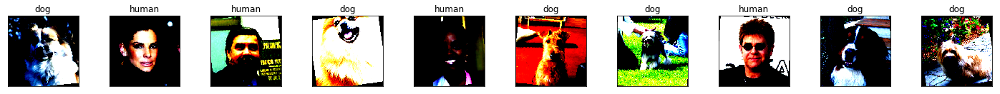

In [10]:
dataiter = iter(train_loader)
images, labels = dataiter.next()
images = images.numpy() # convert images to numpy for display

classes = ['dog', 'human']

# plot the images in the batch, along with the corresponding labels
fig = plt.figure(figsize=(25, 4))
for idx in np.arange(10):
    ax = fig.add_subplot(2, 20/2, idx+1, xticks=[], yticks=[])
    plt.imshow(np.transpose(images[idx], (1, 2, 0)))
    ax.set_title(classes[labels[idx]])

Class to measure data loader time

In [11]:
# class to measure data loader time
class AverageMeter:
    """Computes and stores the average and current value"""
    def __init__(self):
        self.reset()

    def reset(self):
        self.val = 0
        self.avg = 0
        self.sum = 0
        self.count = 0

    def update(self, val, n=1):
        self.val = val
        self.sum += val * n
        self.count += n
        self.avg = self.sum / self.count

Train the model:

In [16]:
import time
import torch.optim as optim

# specify loss function (categorical cross-entropy)
criterion = torch.nn.CrossEntropyLoss()

# if model already trained, then just load it:
if os.path.exists('human_dog_distinctor.pt'):
    print('Shall load pretrained model in next cell.')
    

else:
    torch.cuda.empty_cache()
    # specify optimizer (stochastic gradient descent) and learning rate = 0.001
    optimizer = optim.Adam(hfdetector.parameters(), lr=0.00003)

    start = time.time()
    print(f'Training started at {time.ctime()}')

    # number of epochs to train the model
    n_epochs = 50
    stop_criterion = 5
    valid_loss_min = np.Inf
    early_stop_count = 0

    if torch.cuda.device_count() >= 2:
        print("Let's use", torch.cuda.device_count(), "GPUs!")
        hfdetector = torch.nn.DataParallel(hfdetector)
    elif torch.cuda.is_available():
        hfdetector = hfdetector.cuda()

    # Time meter
    batch_time = AverageMeter()
    data_time = AverageMeter()

    for epoch in range(1, n_epochs+1):

        # keep track of training and validation loss
        train_loss = 0.0
        valid_loss = 0.0

        # early stop mechanism:
        if early_stop_count >= stop_criterion:
            print(f'Validation loss stops decresing for {stop_criterion} epochs, early stop triggered.')
            break

        ###################
        # train the model #
        ###################
        hfdetector.train()
        e = time.time()
        for data, target in train_loader:

            # measure data loading time
            data_time.update(time.time() - e)

            # move tensors to GPU if CUDA is available
            if torch.cuda.is_available():
                data, target = data.cuda(), target.cuda()

            # clear the gradients of all optimized variables
            optimizer.zero_grad()
            # forward pass: compute predicted outputs by passing inputs to the model
            output = hfdetector(data)
            # calculate the batch loss
            loss = criterion(output, target)
            # backward pass: compute gradient of the loss with respect to model parameters
            loss.backward()
            # perform a single optimization step (parameter update)
            optimizer.step()
            # update training loss
            train_loss += loss.item() * data.size(0)

            # measure elapsed time
            batch_time.update(time.time() - e)
            e = time.time()

        ######################    
        # validate the model #
        ######################
        hfdetector.eval()

        for data, target in valid_loader:
            # move tensors to GPU if CUDA is available
            if torch.cuda.is_available():
                data, target = data.cuda(non_blocking=True), target.cuda(non_blocking=True)
            # forward pass: compute predicted outputs by passing inputs to the model
            output = hfdetector(data)
            # calculate the batch loss
            loss = criterion(output, target)
            # update average validation loss 
            valid_loss += loss.item() * data.size(0)

        # calculate average losses
        train_loss = train_loss/len(train_loader.dataset)
        valid_loss = valid_loss/len(valid_loader.dataset)

        # print training/validation statistics 
        print('Epoch: {} \tTraining Loss: {:.6f} \tValidation Loss: {:.6f}'.format(
            epoch, train_loss, valid_loss))

        # save model if validation loss has decreased
        if valid_loss < valid_loss_min:
            print('Validation loss decreased ({:.6f} --> {:.6f}).  Saving model ...'.format(
            valid_loss_min,
            valid_loss))
            torch.save(hfdetector.state_dict(), 'human_dog_distinctor.pt')
            valid_loss_min = valid_loss
            early_stop_count = 0
        else:
            early_stop_count += 1

        # print time
        print(f'Time {batch_time.val:.3f}s ({batch_time.avg:.3f}s) Data {data_time.val:.3f}s ({data_time.avg:.3f}s)')

    end = time.time()
    t = int(end - start)
    print(f'Training ended at {time.ctime()}, total training time is {t//3600}hours {(t%3600)//60}minutes {(t%3600)%60} seconds.')

Training started at Wed Feb 13 17:45:19 2019
Let's use 2 GPUs!


C:\ProgramData\Anaconda3\envs\dl\lib\site-packages\torch\cuda\nccl.py:24: UserWarning: PyTorch is not compiled with NCCL support
  warnings.warn('PyTorch is not compiled with NCCL support')


Epoch: 1 	Training Loss: 0.332098 	Validation Loss: 0.135091
Validation loss decreased (inf --> 0.135091).  Saving model ...
Time 0.281s (1.752s) Data 0.250s (1.597s)
Epoch: 2 	Training Loss: 0.072482 	Validation Loss: 0.043483
Validation loss decreased (0.135091 --> 0.043483).  Saving model ...
Time 0.156s (1.268s) Data 0.109s (1.134s)
Epoch: 3 	Training Loss: 0.033382 	Validation Loss: 0.032611
Validation loss decreased (0.043483 --> 0.032611).  Saving model ...
Time 0.145s (1.106s) Data 0.094s (0.978s)
Epoch: 4 	Training Loss: 0.021480 	Validation Loss: 0.023883
Validation loss decreased (0.032611 --> 0.023883).  Saving model ...
Time 0.141s (1.025s) Data 0.109s (0.901s)
Epoch: 5 	Training Loss: 0.014623 	Validation Loss: 0.018229
Validation loss decreased (0.023883 --> 0.018229).  Saving model ...
Time 0.156s (0.977s) Data 0.109s (0.855s)
Epoch: 6 	Training Loss: 0.012598 	Validation Loss: 0.014789
Validation loss decreased (0.018229 --> 0.014789).  Saving model ...
Time 0.156s (0.

In [17]:
# load model with lowest validation loss
hfdetector.load_state_dict(torch.load('human_dog_distinctor.pt'))

In [18]:
# track test loss
test_loss = 0.0
class_correct = list(0. for i in range(2))
class_total = list(0. for i in range(2))

hfdetector.eval()
# iterate over test data
for data, target in test_loader:
    # move tensors to GPU if CUDA is available
    if torch.cuda.is_available():
        data, target = data.cuda(), target.cuda()
    # forward pass: compute predicted outputs by passing inputs to the model
    output = hfdetector(data)
    # calculate the batch loss
    loss = criterion(output, target)
    # print(f'loss -> {loss}  output -> {F.softmax(output)}  target -> {target}')
    # update test loss 
    test_loss += loss.item() * data.size(0)
    
    # convert output probabilities to predicted class
    _, pred = torch.max(output, 1)
    
    # compare predictions to true label
    correct_tensor = pred.eq(target.data.view_as(pred))
    correct = np.squeeze(correct_tensor.numpy()) if not torch.cuda.is_available() else np.squeeze(correct_tensor.cpu().numpy())
    
    # calculate test accuracy for each object class
    for i in range(batch_size):
        if i >= target.data.shape[0]:
            break
        label = target.data[i]
        class_correct[label] += correct[i].item()
        class_total[label] += 1

# average test loss
test_loss = test_loss/len(test_loader.dataset)
print('Test Loss: {:.6f}\n'.format(test_loss))

for i in range(2):
    if class_total[i] > 0:
        print('Test Accuracy of %5s: %2d%% (%2d/%2d)' % (
            classes[i], 100 * class_correct[i] / class_total[i],
            np.sum(class_correct[i]), np.sum(class_total[i])))
    else:
        print('Test Accuracy of %5s: N/A (no training examples)' % (classes[i]))

print('\nTest Accuracy (Overall): %2d%% (%2d/%2d)' % (
    100. * np.sum(class_correct) / np.sum(class_total),
    np.sum(class_correct), np.sum(class_total)))

Test Loss: 0.005199

Test Accuracy of   dog: 99% (1668/1670)
Test Accuracy of human: 99% (2645/2647)

Test Accuracy (Overall): 99% (4313/4317)


#### Visualize Sample Test Results

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

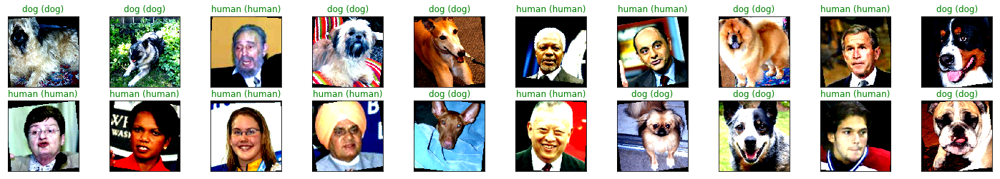

In [19]:
import matplotlib.pyplot as plt
%matplotlib inline

# helper function to un-normalize and display an image
def imshow(img):
    if torch.cuda.is_available():
        img = img.cpu()
    img = img / 2 + 0.5  # unnormalize
    plt.imshow(np.transpose(img, (1, 2, 0)))  # convert from Tensor image

# obtain one batch of test images
dataiter = iter(test_loader)
images, labels = dataiter.next()
images.numpy()

# move model inputs to cuda, if GPU available
if torch.cuda.is_available():
    images = images.cuda(non_blocking=True)

# get sample outputs
output = hfdetector(images)

# convert output probabilities to predicted class
_, preds_tensor = torch.max(output, 1)
preds = np.squeeze(preds_tensor.numpy()) if not torch.cuda.is_available() else np.squeeze(preds_tensor.cpu().numpy())

# plot the images in the batch, along with predicted and true labels
fig = plt.figure(figsize=(25, 4))
for idx in np.arange(20):
    ax = fig.add_subplot(2, 20/2, idx+1, xticks=[], yticks=[])
    imshow(images[idx])
    ax.set_title("{} ({})".format(classes[preds[idx]], classes[labels[idx]]),
                 color=("green" if preds[idx]==labels[idx].item() else "red"))

In [20]:
### (Optional) 
### TODO: Test performance of anotherface detection algorithm.
### Feel free to use as many code cells as needed.
import torchvision.transforms.functional as TF

def cnn_face_detector(img_path):
    '''
    Detector to dectect human face using a trained deep learning model.
    Return the index of prediction.
    Params:
        img_path: A path of an image
    '''

    classifier = HumanFaceDetector()
    # because the state_dict is saved as a model that trained under parallel mode:
    classifier = torch.nn.DataParallel(classifier)
    classifier.load_state_dict(torch.load('human_dog_distinctor.pt'))
    
    image = Image.open(img_path)
    # Transforms:
    image = TF.resize(image, 256)
    center_crop = transforms.CenterCrop(224)
    image = center_crop(image)
    image = TF.to_tensor(image)
    normalize = transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))
                                
    image = normalize(image)
    image = image.view(1, *tuple(image.shape))
    # add additional batch dimension for singleton image:
    
    if torch.cuda.is_available():
        classifier = classifier.cuda()
        image = image.cuda()
    output = classifier(image)
    _, pred = torch.max(output, 1)
    return pred

In [21]:
from tqdm import tqdm

human_files_short = human_files[:100]
dog_files_short = dog_files[:100]
#-#-# Do NOT modify the code above this line. #-#-#

## TODO: Test the performance of the face_detector algorithm 
## on the images in human_files_short and dog_files_short.
# for human_file in human_files_short:
human_as_human = 0
dog_as_human = 0
for h in tqdm(range(len(human_files_short)), ascii=True):
    if cnn_face_detector(human_files_short[h]):
        human_as_human += 1
human_pct = human_as_human / 100

for d in tqdm(range(len(dog_files_short)), ascii=True):
    if cnn_face_detector(dog_files_short[d]):
        dog_as_human += 1
dog_pct = dog_as_human / 100
print(f'Human detected as human: {human_pct * 100}%')   
print(f'Dog detected as human: {dog_pct * 100}%')

100%|###########################################################################| 100/100 [00:12<00:00,  7.80it/s]


Human detected as human: 99.0%
Dog detected as human: 5.0%


We can see that the accuracy has improved.

---
<a id='step2'></a>
## Step 2: Detect Dogs

In this section, we use a [pre-trained model](http://pytorch.org/docs/master/torchvision/models.html) to detect dogs in images.  

### Obtain Pre-trained VGG-16 Model

The code cell below downloads the VGG-16 model, along with weights that have been trained on [ImageNet](http://www.image-net.org/), a very large, very popular dataset used for image classification and other vision tasks.  ImageNet contains over 10 million URLs, each linking to an image containing an object from one of [1000 categories](https://gist.github.com/yrevar/942d3a0ac09ec9e5eb3a).  

In [22]:
import torch
import torchvision.models as models

# define VGG16 model
VGG16 = models.vgg16(pretrained=True)

# check if CUDA is available
use_cuda = torch.cuda.is_available()

# move model to GPU if CUDA is available
if use_cuda:
    VGG16 = VGG16.cuda()

Given an image, this pre-trained VGG-16 model returns a prediction (derived from the 1000 possible categories in ImageNet) for the object that is contained in the image.

### (IMPLEMENTATION) Making Predictions with a Pre-trained Model

In the next code cell, you will write a function that accepts a path to an image (such as `'dogImages/train/001.Affenpinscher/Affenpinscher_00001.jpg'`) as input and returns the index corresponding to the ImageNet class that is predicted by the pre-trained VGG-16 model.  The output should always be an integer between 0 and 999, inclusive.

Before writing the function, make sure that you take the time to learn  how to appropriately pre-process tensors for pre-trained models in the [PyTorch documentation](http://pytorch.org/docs/stable/torchvision/models.html).

In [23]:
from PIL import Image
import torchvision.transforms as transforms
import torchvision.transforms.functional as TF

def load_image(img_path, max_size=400, shape=None):
    ''' Load in and transform an image, making sure the image
       is <= 400 pixels in the x-y dims.'''
    
    image = Image.open(img_path).convert('RGB')
    
    # large images will slow down processing
    if max(image.size) > max_size:
        size = max_size
    else:
        size = max(image.size)
    
    if shape is not None:
        size = shape
        
    in_transform = transforms.Compose([
                        transforms.Resize(size),
                        transforms.ToTensor(),
                        transforms.Normalize((0.485, 0.456, 0.406), 
                                             (0.229, 0.224, 0.225))])

    # discard the transparent, alpha channel (that's the :3) and add the batch dimension
    image = in_transform(image)[:3,:,:].unsqueeze(0)
    if torch.cuda.is_available():
        image = image.cuda()
    return image


def VGG16_predict(img_path):
    '''
    Use pre-trained VGG-16 model to obtain index corresponding to 
    predicted ImageNet class for image at specified path
    
    Args:
        img_path: path to an image
        
    Returns:
        Index corresponding to VGG-16 model's prediction
    '''
    ## TODO: Complete the function.
    ## Load and pre-process an image from the given img_path
    ## Return the *index* of the predicted class for that image
    image = Image.open(img_path)
    image = TF.resize(image, 250)
    center_crop = transforms.CenterCrop(224)
    image = center_crop(image)
    image = TF.to_tensor(image)
    normalize = transforms.Normalize([0.485, 0.456, 0.406], 
                                     [0.229, 0.224, 0.225])
    image = normalize(image)
    image = image.view(1, *tuple(image.shape))
    if torch.cuda.is_available():
        image = image.cuda()
    res = VGG16(image)
    _, index = torch.max(res, 1)
    return index

### (IMPLEMENTATION) Write a Dog Detector

While looking at the [dictionary](https://gist.github.com/yrevar/942d3a0ac09ec9e5eb3a), you will notice that the categories corresponding to dogs appear in an uninterrupted sequence and correspond to dictionary keys 151-268, inclusive, to include all categories from `'Chihuahua'` to `'Mexican hairless'`.  Thus, in order to check to see if an image is predicted to contain a dog by the pre-trained VGG-16 model, we need only check if the pre-trained model predicts an index between 151 and 268 (inclusive).

Use these ideas to complete the `dog_detector` function below, which returns `True` if a dog is detected in an image (and `False` if not).

In [24]:
### returns "True" if a dog is detected in the image stored at img_path
def dog_detector(img_path):
    ## TODO: Complete the function.
    index = VGG16_predict(img_path)
    # inclusive index range: [151, 268]
    return ((index >= 151) and (index <= 268))

### (IMPLEMENTATION) Assess the Dog Detector

__Question 2:__ Use the code cell below to test the performance of your `dog_detector` function.  
- What percentage of the images in `human_files_short` have a detected dog?  
- What percentage of the images in `dog_files_short` have a detected dog?

__Answer:__ 


In [25]:
from tqdm import tqdm

human_files_short = human_files[:100]
dog_files_short = dog_files[:100]
#-#-# Do NOT modify the code above this line. #-#-#

# Test the performance of the dog_detector algorithm 
# on the images in human_files_short and dog_files_short.
human_as_dog = 0
dog_as_dog = 0
for h in tqdm(range(len(human_files_short)), ascii=True):
    if dog_detector(human_files_short[h]):
        human_as_dog += 1
human_pct = human_as_dog / 100

for d in tqdm(range(len(dog_files_short)), ascii=True):
    if dog_detector(dog_files_short[d]):
        dog_as_dog += 1
dog_pct = dog_as_dog / 100
print(f'Human detected as dog: {human_pct * 100}%')   
print(f'Dog detected as dog: {dog_pct * 100}%')

100%|###########################################################################| 100/100 [00:01<00:00, 71.34it/s]


Human detected as dog: 0.0%
Dog detected as dog: 97.0%


We suggest VGG-16 as a potential network to detect dog images in your algorithm, but you are free to explore other pre-trained networks (such as [Inception-v3](http://pytorch.org/docs/master/torchvision/models.html#inception-v3), [ResNet-50](http://pytorch.org/docs/master/torchvision/models.html#id3), etc).  Please use the code cell below to test other pre-trained PyTorch models.  If you decide to pursue this _optional_ task, report performance on `human_files_short` and `dog_files_short`.

In [26]:
### (Optional) 
### TODO: Report the performance of another pre-trained network.
### Feel free to use as many code cells as needed.

---
<a id='step3'></a>
## Step 3: Create a CNN to Classify Dog Breeds (from Scratch)

Now that we have functions for detecting humans and dogs in images, we need a way to predict breed from images.  In this step, you will create a CNN that classifies dog breeds.  You must create your CNN _from scratch_ (so, you can't use transfer learning _yet_!), and you must attain a test accuracy of at least 10%.  In Step 4 of this notebook, you will have the opportunity to use transfer learning to create a CNN that attains greatly improved accuracy.

We mention that the task of assigning breed to dogs from images is considered exceptionally challenging.  To see why, consider that *even a human* would have trouble distinguishing between a Brittany and a Welsh Springer Spaniel.  

Brittany | Welsh Springer Spaniel
- | - 
<img src="images/Brittany_02625.jpg" width="100"> | <img src="images/Welsh_springer_spaniel_08203.jpg" width="200">

It is not difficult to find other dog breed pairs with minimal inter-class variation (for instance, Curly-Coated Retrievers and American Water Spaniels).  

Curly-Coated Retriever | American Water Spaniel
- | -
<img src="images/Curly-coated_retriever_03896.jpg" width="200"> | <img src="images/American_water_spaniel_00648.jpg" width="200">


Likewise, recall that labradors come in yellow, chocolate, and black.  Your vision-based algorithm will have to conquer this high intra-class variation to determine how to classify all of these different shades as the same breed.  

Yellow Labrador | Chocolate Labrador | Black Labrador
- | -
<img src="images/Labrador_retriever_06457.jpg" width="150"> | <img src="images/Labrador_retriever_06455.jpg" width="240"> | <img src="images/Labrador_retriever_06449.jpg" width="220">

We also mention that random chance presents an exceptionally low bar: setting aside the fact that the classes are slightly imabalanced, a random guess will provide a correct answer roughly 1 in 133 times, which corresponds to an accuracy of less than 1%.  

Remember that the practice is far ahead of the theory in deep learning.  Experiment with many different architectures, and trust your intuition.  And, of course, have fun!

### (IMPLEMENTATION) Specify Data Loaders for the Dog Dataset

Use the code cell below to write three separate [data loaders](http://pytorch.org/docs/stable/data.html#torch.utils.data.DataLoader) for the training, validation, and test datasets of dog images (located at `dogImages/train`, `dogImages/valid`, and `dogImages/test`, respectively).  You may find [this documentation on custom datasets](http://pytorch.org/docs/stable/torchvision/datasets.html) to be a useful resource.  If you are interested in augmenting your training and/or validation data, check out the wide variety of [transforms](http://pytorch.org/docs/stable/torchvision/transforms.html?highlight=transform)!

In [27]:
import os
import numpy as np
import time
import copy
from glob import glob

import torch
import torchvision
import matplotlib.pyplot as plt
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.optim import lr_scheduler
from torchvision import datasets, models
import torchvision.transforms as transforms
from torch.utils.data.sampler import SubsetRandomSampler
from PIL import Image
from torch.autograd import Variable
import random

from PIL import ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True

plt.ion()   # interactive mode
%matplotlib inline

In [28]:
### TODO: Write data loaders for training, validation, and test sets
## Specify appropriate transforms, and batch_sizes

# Hyperparameters:
batch_size = 64
num_workers = 0

# data root
train_dir = 'dogImages/train'
valid_dir = 'dogImages/valid'
test_dir = 'dogImages/test'

# preprocess images: shrink too big images:
raw_files = np.array(glob('dogImages/*/*/*.jpg'))

for path in raw_files:
    shrink_large_img(path)

# training data transforms
train_transforms = transforms.Compose([transforms.Resize(256),
                                       transforms.CenterCrop(224),
                                       transforms.RandomHorizontalFlip(),
                                       transforms.RandomRotation(10),
                                       transforms.ToTensor(),
                                       transforms.Normalize([0.485, 0.456, 0.406], 
                                                            [0.229, 0.224, 0.225])
                                      ])

# validation and test data transforms
vt_transforms = transforms.Compose([transforms.Resize(256),
                                    transforms.CenterCrop(224),
                                    transforms.RandomHorizontalFlip(),
                                    transforms.RandomRotation(10),
                                    transforms.ToTensor(),
                                    transforms.Normalize([0.485, 0.456, 0.406], 
                                                         [0.229, 0.224, 0.225])
                                   ])


# Pass transforms in here, then run the next cell to see how the transforms look
train_data = datasets.ImageFolder(train_dir, transform=train_transforms)
valid_data = datasets.ImageFolder(valid_dir, transform=vt_transforms)
test_data = datasets.ImageFolder(test_dir, transform=vt_transforms)

train_loader = torch.utils.data.DataLoader(train_data, batch_size=batch_size, num_workers=num_workers, shuffle=True)
valid_loader = torch.utils.data.DataLoader(valid_data, batch_size=batch_size, num_workers=num_workers, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_data, batch_size=batch_size, num_workers=num_workers, shuffle=True)

In [29]:
loaders_scratch = {'train': train_loader, 'valid': valid_loader, 'test': test_loader}
class_names = train_data.classes
n_classes = len(class_names)
print(n_classes)

133


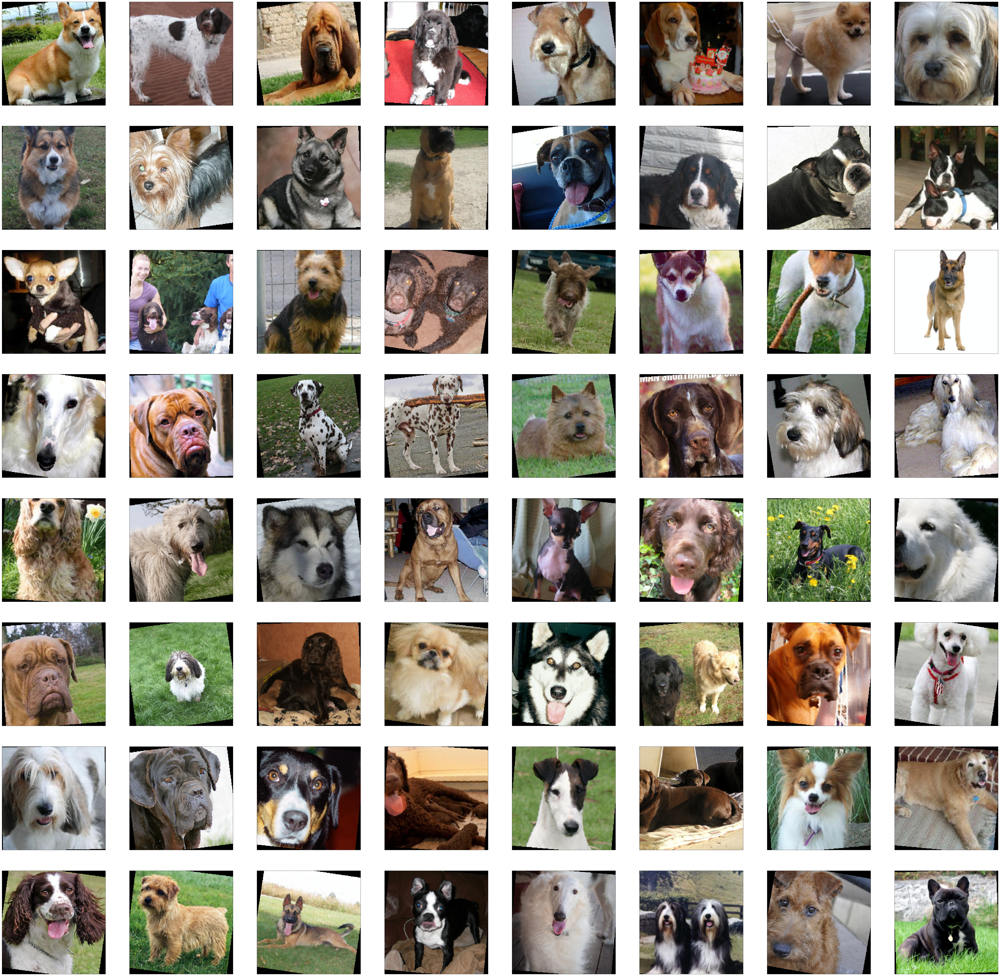

In [30]:
def imshow(inp):
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)    
    plt.imshow(inp)
    
# Get a batch of training data
images, classes = next(iter(loaders_scratch['train']))
      
fig = plt.figure(figsize=(100,100))
for idx in np.arange(batch_size):
    ax = fig.add_subplot(8, batch_size//8, idx+1, xticks=[], yticks=[])
    imshow(images[idx])
    # ax.set_title(class_names[classes[idx]].split(".")[1])

**Question 3:** Describe your chosen procedure for preprocessing the data. 
- How does your code resize the images (by cropping, stretching, etc)?  What size did you pick for the input tensor, and why?
- Did you decide to augment the dataset?  If so, how (through translations, flips, rotations, etc)?  If not, why not?


**Answer**:

All images are resized and used all color channel to 224x224x3 and normalized. This size is used by pretrained model, so it is suggested to use the same size to compare performances.

1. Crop: Random Cropping is a common method in augmentation, which is to randomly sample a section from the original image and resize it to its original image size. In our experiment, we randomly extract a 224 × 224 pixels section from 256 × 256 pixels.

2. Flip: Each image can be flipped horizontally and vertically. In our task, images are just flipped horizontally.

3. Rotation: Each image can be rotate. In our task, images are roated 10 degree.

### (IMPLEMENTATION) Model Architecture

Create a CNN to classify dog breed.  Use the template in the code cell below.

In [31]:
import torch.nn as nn
import torch.nn.functional as F

final_conv = 1024

# define the CNN architecture
class Net(nn.Module):
    ### TODO: choose an architecture, and complete the class
    def __init__(self):
        super(Net, self).__init__()
        
        ## Define layers of a CNN
        # convolutional layer (sees 224x224x3 image tensor)
        self.conv1 = nn.Conv2d(3, 16, 3, padding = 1 )        
        # convolutional layer (sees 112x112x16 image tensor)
        self.conv2 = nn.Conv2d(16, 32, 3, padding = 1)
        # convolutional layer (sees 56x56x32 image tensor)
        self.conv3 = nn.Conv2d(32, 64, 3, padding = 1)
        # convolutional layer (sees 28x28x64 image tensor)
        self.conv4 = nn.Conv2d(64, 128, 3, padding = 1)        
        # convolutional layer (sees 14x14x128 image tensor)
        self.conv5 = nn.Conv2d(128, 256, 3, padding = 1 )
        
        # max pooling layer
        self.pool = nn.MaxPool2d(2, 2)
        # dropout layer (p=0.2)
        self.dropout = nn.Dropout(0.4)
        
        self.conv_bn1 = nn.BatchNorm2d(16)
        self.conv_bn2 = nn.BatchNorm2d(32)
        self.conv_bn3 = nn.BatchNorm2d(64)
        self.conv_bn4 = nn.BatchNorm2d(128)
        self.conv_bn5 = nn.BatchNorm2d(256)
        
        # linear layer (256 * 7 * 7 -> 512)
        self.fc1 = nn.Linear(256 * 7 * 7, 512)
        # linear layer (256 * 7 * 7 -> n_classes (133))
        self.fc2 = nn.Linear(512, n_classes)
    
    def forward(self, x):
        ## Define forward behavior
        # add sequence of convolutional and max pooling layers
        x = self.pool(F.relu(self.conv1(x)))
        x = self.conv_bn1(x)
        x = self.pool(F.relu(self.conv2(x)))
        x = self.conv_bn2(x)
        x = self.pool(F.relu(self.conv3(x)))
        x = self.conv_bn3(x)
        x = self.pool(F.relu(self.conv4(x)))
        x = self.conv_bn4(x)
        x = self.pool(F.relu(self.conv5(x)))
        x = self.conv_bn5(x)
        
        # flatten image input
        x = x.view(-1, 256 * 7 * 7)        
        # add dropout layer
        x = self.dropout(x)
        # add second hidden layer
        x = F.relu(self.fc1(x))
        x = self.dropout(x)
        x = self.fc2(x)
        return x

#-#-# You so NOT have to modify the code below this line. #-#-#

# instantiate the CNN
model_scratch = Net()

# move tensors to GPU if CUDA is available
if use_cuda:
    model_scratch.cuda()
print(model_scratch)

Net(
  (conv1): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv3): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv4): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv5): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (dropout): Dropout(p=0.4)
  (conv_bn1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv_bn2): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv_bn3): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv_bn4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv_bn5): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (fc1): Linear(in_feat

__Question 4:__ Outline the steps you took to get to your final CNN architecture and your reasoning at each step.  

__Answer:__ 

1. Five convolution layers are used all with the colvolution of size = 3, stride = 1 and padding = 1. Five convolutional layers are defined with 16/32/64/128/256 filters respectively, each followed by a max pooling layer.
2. Also two connected linear layer at the end are used.
3. Relu activations are used after each layers except the last one.
4. Max pooling layers of 2*2 are applied.
5. Batch normalized are applied after each max pooling.
6. Dropout is applied with the probability of 0.4

### (IMPLEMENTATION) Specify Loss Function and Optimizer

Use the next code cell to specify a [loss function](http://pytorch.org/docs/stable/nn.html#loss-functions) and [optimizer](http://pytorch.org/docs/stable/optim.html).  Save the chosen loss function as `criterion_scratch`, and the optimizer as `optimizer_scratch` below.

In [32]:
import torch.optim as optim

### TODO: select loss function
criterion_scratch = torch.nn.CrossEntropyLoss()

### TODO: select optimizer
# optimizer_scratch = optim.Adam(model_scratch.parameters(), lr=0.001)
optimizer_scratch = optim.SGD(model_scratch.parameters(), lr=0.001, momentum=0.9)

### (IMPLEMENTATION) Train and Validate the Model

Train and validate your model in the code cell below.  [Save the final model parameters](http://pytorch.org/docs/master/notes/serialization.html) at filepath `'model_scratch.pt'`.

In [33]:
def train(n_epochs, loaders, model, optimizer, criterion, use_cuda, save_path):
    """returns trained model"""
    # initialize tracker for minimum validation loss
    valid_loss_min = np.Inf
    
    # early stop mechanism
    stop_criterion = 6
    early_stop_count = 0
    
    if torch.cuda.device_count() >= 4:
        print("Let's use", torch.cuda.device_count(), "GPUs!")
        model = torch.nn.DataParallel(model)
    elif torch.cuda.is_available():
        model = model.cuda()
    
    # timer
    start = time.time()
    print(f'Training started at {time.ctime()}')
    
    for epoch in range(1, n_epochs+1):
        # initialize variables to monitor training and validation loss
        train_loss = 0.0
        valid_loss = 0.0
        
        # early stop mechanism:
        if early_stop_count >= stop_criterion:
            print(f'Validation loss stops decresing for {stop_criterion} epochs, early stop triggered.')
            break
        
        ###################
        # train the model #
        ###################
        model.train()
        e = time.time()
        for batch_idx, (data, target) in enumerate(loaders['train']):
            # move to GPU
            if use_cuda:
                data, target = data.cuda(), target.cuda()
            
            # clear the gradients of all optimized variables
            optimizer.zero_grad()
            output = model(data)
            loss = criterion(output, target)
            loss.backward()
            optimizer.step()
            
            # update training loss
            train_loss += loss.item() * data.size(0)
            
        ######################    
        # validate the model #
        ######################
        model.eval()
        for batch_idx, (data, target) in enumerate(loaders['valid']):
            # move to GPU
            if use_cuda:
                data, target = data.cuda(), target.cuda()
            ## update the average validation loss
            output = model(data)
            loss = criterion(output, target)
            valid_loss += loss.item() * data.size(0)
            
        # calculate average losses
        train_loss = train_loss/len(train_loader.dataset)
        valid_loss = valid_loss/len(valid_loader.dataset)
            
        # print training/validation statistics 
        print(f'Epoch: {epoch} \tTraining Loss: {train_loss:.6f} \tValidation Loss: {valid_loss:.6f}')
        
        ## TODO: save the model if validation loss has decreased
        if valid_loss < valid_loss_min:
            print(f'Validation loss decreased ({valid_loss_min:.6f} --> {valid_loss:.6f}).  Saving model ...')
            torch.save(model.state_dict(), save_path)
            valid_loss_min = valid_loss
            early_stop_count = 0
        else:
            early_stop_count += 1
        
    # return trained model
    end = time.time()
    t = int(end - start)
    print(f'Training ended at {time.ctime()}, total training time is {t//3600}hours {(t%3600)//60}minutes {(t%3600)%60} seconds.')
    return model


# train the model
model_scratch = train(50, loaders_scratch, model_scratch, optimizer_scratch, criterion_scratch, use_cuda, 'model_scratch.pt')

# load the model that got the best validation accuracy
model_scratch.load_state_dict(torch.load('model_scratch.pt'))

Training started at Wed Feb 13 20:03:45 2019
Epoch: 1 	Training Loss: 4.860414 	Validation Loss: 4.743081
Validation loss decreased (inf --> 4.743081).  Saving model ...
Epoch: 2 	Training Loss: 4.636782 	Validation Loss: 4.527133
Validation loss decreased (4.743081 --> 4.527133).  Saving model ...
Epoch: 3 	Training Loss: 4.425442 	Validation Loss: 4.371483
Validation loss decreased (4.527133 --> 4.371483).  Saving model ...
Epoch: 4 	Training Loss: 4.248471 	Validation Loss: 4.247406
Validation loss decreased (4.371483 --> 4.247406).  Saving model ...
Epoch: 5 	Training Loss: 4.098824 	Validation Loss: 4.141359
Validation loss decreased (4.247406 --> 4.141359).  Saving model ...
Epoch: 6 	Training Loss: 3.973699 	Validation Loss: 4.064967
Validation loss decreased (4.141359 --> 4.064967).  Saving model ...
Epoch: 7 	Training Loss: 3.860932 	Validation Loss: 3.958767
Validation loss decreased (4.064967 --> 3.958767).  Saving model ...
Epoch: 8 	Training Loss: 3.753351 	Validation Loss

### (IMPLEMENTATION) Test the Model

Try out your model on the test dataset of dog images.  Use the code cell below to calculate and print the test loss and accuracy.  Ensure that your test accuracy is greater than 10%.

In [34]:
def test(loaders, model, criterion, use_cuda):

    # monitor test loss and accuracy
    test_loss = 0.
    correct = 0.
    total = 0.

    model.eval()
    for batch_idx, (data, target) in enumerate(loaders['test']):
        # move to GPU
        if use_cuda:
            data, target = data.cuda(), target.cuda()
        # forward pass: compute predicted outputs by passing inputs to the model
        output = model(data)
        # calculate the loss
        loss = criterion(output, target)
        # update average test loss 
        test_loss = test_loss + ((1 / (batch_idx + 1)) * (loss.data - test_loss))
        # convert output probabilities to predicted class
        pred = output.data.max(1, keepdim=True)[1]
        # compare predictions to true label
        correct += np.sum(np.squeeze(pred.eq(target.data.view_as(pred))).cpu().numpy())
        total += data.size(0)
            
    print(f'Test Loss: {test_loss:.6f}\n')

    print(f'\nTest Accuracy: {100. * correct / total} ({correct}/{total})')

# call test function
test(loaders_scratch, model_scratch, criterion_scratch, use_cuda)

Test Loss: 2.989927


Test Accuracy: 28.229665071770334 (236.0/836.0)


---
<a id='step4'></a>
## Step 4: Create a CNN to Classify Dog Breeds (using Transfer Learning)

You will now use transfer learning to create a CNN that can identify dog breed from images.  Your CNN must attain at least 60% accuracy on the test set.

### (IMPLEMENTATION) Specify Data Loaders for the Dog Dataset

Use the code cell below to write three separate [data loaders](http://pytorch.org/docs/master/data.html#torch.utils.data.DataLoader) for the training, validation, and test datasets of dog images (located at `dogImages/train`, `dogImages/valid`, and `dogImages/test`, respectively). 

If you like, **you are welcome to use the same data loaders from the previous step**, when you created a CNN from scratch.

In [35]:
## TODO: Specify data loaders
import os
from torchvision import datasets, transforms

### TODO: Write data loaders for training, validation, and test sets
## Specify appropriate transforms, and batch_sizes

# Hyperparameters:
batch_size = 16
num_workers = 0

# data root
train_dir = 'dogImages/train'
valid_dir = 'dogImages/valid'
test_dir = 'dogImages/test'

# preprocess images: shrink too big images:
raw_files = np.array(glob('dogImages/*/*/*.jpg'))
print(len(raw_files))

for path in raw_files:
    shrink_large_img(path)

# training data transforms
train_transforms = transforms.Compose([transforms.Resize(256),
                                       transforms.CenterCrop(224),
                                       transforms.RandomHorizontalFlip(),
                                       transforms.RandomRotation(10),
                                       transforms.ToTensor(),
                                       transforms.Normalize([0.485, 0.456, 0.406], 
                                                            [0.229, 0.224, 0.225])
                                      ])

# validation and test data transforms
vt_transforms = transforms.Compose([transforms.Resize(256),
                                    transforms.CenterCrop(224),
                                    transforms.RandomHorizontalFlip(),
                                    transforms.RandomRotation(10),
                                    transforms.ToTensor(),
                                    transforms.Normalize([0.485, 0.456, 0.406], 
                                                         [0.229, 0.224, 0.225])
                                   ])


# Pass transforms in here, then run the next cell to see how the transforms look
train_data = datasets.ImageFolder(train_dir, transform=train_transforms)
valid_data = datasets.ImageFolder(valid_dir, transform=vt_transforms)
test_data = datasets.ImageFolder(test_dir, transform=vt_transforms)

train_loader = torch.utils.data.DataLoader(train_data, batch_size=batch_size, num_workers=num_workers, shuffle=True, pin_memory=True)
valid_loader = torch.utils.data.DataLoader(valid_data, batch_size=batch_size, num_workers=num_workers, shuffle=True, pin_memory=True)
test_loader = torch.utils.data.DataLoader(test_data, batch_size=batch_size, num_workers=num_workers, shuffle=True, pin_memory=True)

loaders_transfer = {'train': train_loader, 'valid': valid_loader, 'test': test_loader}

8350


### (IMPLEMENTATION) Model Architecture

Use transfer learning to create a CNN to classify dog breed.  Use the code cell below, and save your initialized model as the variable `model_transfer`.

In [36]:
########################## VGG16 ############################
'''
model_transfer = models.vgg16(pretrained = True) 
## Freeze training for all "features" layers
for param in model_transfer.parameters():
    param.requires_grad = False
    
n_inputs = model_transfer.classifier[6].in_features
last_layer = nn.Linear(n_inputs, n_classes)
model_transfer.classifier[6] = last_layer
'''
##############################################################

########################## RESNET ############################
'''
model_transfer = models.resnet18(pretrained=True)
# model_transfer = models.resnet50(pretrained=True)
## Freeze training for all "features" layers
for param in model_transfer.parameters():
    param.requires_grad = False

num_features = model_transfer.fc.in_features
model_transfer.fc = nn.Linear(num_features, n_classes)
'''
##############################################################

######################### densenet ###########################

model_transfer = models.densenet161(pretrained=True)
for param in model_transfer.parameters():
    param.requires_grad = False
num_features = model_transfer.classifier.in_features
model_transfer.classifier = nn.Linear(num_features, n_classes)

##############################################################

if use_cuda:
    model_transfer.cuda()
print(model_transfer)

C:\ProgramData\Anaconda3\envs\dl\lib\site-packages\torchvision\models\densenet.py:212: UserWarning: nn.init.kaiming_normal is now deprecated in favor of nn.init.kaiming_normal_.
  nn.init.kaiming_normal(m.weight.data)


DenseNet(
  (features): Sequential(
    (conv0): Conv2d(3, 96, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (norm0): BatchNorm2d(96, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu0): ReLU(inplace)
    (pool0): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (denseblock1): _DenseBlock(
      (denselayer1): _DenseLayer(
        (norm1): BatchNorm2d(96, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu1): ReLU(inplace)
        (conv1): Conv2d(96, 192, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (norm2): BatchNorm2d(192, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu2): ReLU(inplace)
        (conv2): Conv2d(192, 48, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      )
      (denselayer2): _DenseLayer(
        (norm1): BatchNorm2d(144, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu1): ReLU(inpla

)


__Question 5:__ Outline the steps you took to get to your final CNN architecture and your reasoning at each step.  Describe why you think the architecture is suitable for the current problem.

__Answer:__ 

Steps conducted:

      1. slice off the end of the neural network
      2. freeze all the network except the final layer. Set requires_grad == False to freeze the parameters.
      3. add a new fully connected layer that matches the number of classes in the new data set
      4. randomize the weights of the new fully connected layer; freeze all the weights from the pre-trained network
      5. train the network to update the weights of the new fully connected layer


After comparing the test accuracy of different models I decided to select DenseNet161 model.

### (IMPLEMENTATION) Specify Loss Function and Optimizer

Use the next code cell to specify a [loss function](http://pytorch.org/docs/master/nn.html#loss-functions) and [optimizer](http://pytorch.org/docs/master/optim.html).  Save the chosen loss function as `criterion_transfer`, and the optimizer as `optimizer_transfer` below.

In [38]:
criterion_transfer = nn.CrossEntropyLoss()

optimizer_transfer = optim.SGD(model_transfer.classifier.parameters(), lr=0.001, momentum=0.9)

### (IMPLEMENTATION) Train and Validate the Model

Train and validate your model in the code cell below.  [Save the final model parameters](http://pytorch.org/docs/master/notes/serialization.html) at filepath `'model_transfer.pt'`.

In [39]:
torch.cuda.empty_cache()
model_transfer = train(50, loaders_transfer, model_transfer, optimizer_transfer, criterion_transfer, use_cuda, 'model_transfer.pt')

model_transfer.load_state_dict(torch.load('model_transfer.pt'))

Training started at Wed Feb 13 20:56:03 2019
Epoch: 1 	Training Loss: 3.601315 	Validation Loss: 2.174575
Validation loss decreased (inf --> 2.174575).  Saving model ...
Epoch: 2 	Training Loss: 1.846292 	Validation Loss: 1.244253
Validation loss decreased (2.174575 --> 1.244253).  Saving model ...
Epoch: 3 	Training Loss: 1.216002 	Validation Loss: 0.889115
Validation loss decreased (1.244253 --> 0.889115).  Saving model ...
Epoch: 4 	Training Loss: 0.928520 	Validation Loss: 0.704303
Validation loss decreased (0.889115 --> 0.704303).  Saving model ...
Epoch: 5 	Training Loss: 0.772313 	Validation Loss: 0.649718
Validation loss decreased (0.704303 --> 0.649718).  Saving model ...
Epoch: 6 	Training Loss: 0.674394 	Validation Loss: 0.581786
Validation loss decreased (0.649718 --> 0.581786).  Saving model ...
Epoch: 7 	Training Loss: 0.587030 	Validation Loss: 0.535149
Validation loss decreased (0.581786 --> 0.535149).  Saving model ...
Epoch: 8 	Training Loss: 0.549280 	Validation Loss

### (IMPLEMENTATION) Test the Model

Try out your model on the test dataset of dog images. Use the code cell below to calculate and print the test loss and accuracy.  Ensure that your test accuracy is greater than 60%.

In [40]:
test(loaders_transfer, model_transfer, criterion_transfer, use_cuda)

Test Loss: 0.408938


Test Accuracy: 87.67942583732058 (733.0/836.0)


### (IMPLEMENTATION) Predict Dog Breed with the Model

Write a function that takes an image path as input and returns the dog breed (`Affenpinscher`, `Afghan hound`, etc) that is predicted by your model.  

In [41]:
# TODO: Write a function that takes a path to an image as input and returns the dog breed that is predicted by the model.

import matplotlib.image as mpimg
# list of class names by index, i.e. a name can be accessed like class_names[0]
class_names = [item.split('.')[1] for item in class_names]
# print(class_names)

def predict_breed_transfer(img_path):
    # load the image and return the predicted breed
    image = Image.open(img_path)
    normalize = transforms.Normalize([0.485, 0.456, 0.406],
                                     [0.229, 0.224, 0.225])
    preprocess = transforms.Compose([transforms.Resize(224),
                                     transforms.CenterCrop(224),
                                     transforms.ToTensor(),
                                     normalize])
    
    img_tensor = preprocess(image).float()
    img_tensor.unsqueeze_(0)                      # Insert the new axis at index 0 i.e. in front of the other axes/dims.
    img_tensor = Variable(img_tensor)             #The input to the network needs to be an autograd Variable
    
    if use_cuda:
        img_tensor = Variable(img_tensor.cuda())        
    model_transfer.eval()
    output = model_transfer(img_tensor)           # Returns a Tensor of shape (batch, num class labels)
    output = output.cpu()
    predict_index = output.data.numpy().argmax()  # Our prediction will be the index of the class label with the largest value.
    return predict_index, class_names[predict_index], train_data.classes[predict_index]

In [50]:
### Display prediction
def display_predictions(img_path):
    
    pred_index, breed, name = predict_breed_transfer(img_path)
    print('Dog detected')
        
    # display test image
    fig = plt.figure(figsize=(16,4))
    ax = fig.add_subplot(1,2,1)
    img = mpimg.imread(img_path)
    ax.imshow(img)
    plt.axis('off')

    # display sample of matching breed images
    subdir = '/'.join(['dogImages/valid/', str(name)])
    file = random.choice(os.listdir(subdir))
    path = '/'.join([subdir, file])
    ax = fig.add_subplot(1,2,2)
    img = mpimg.imread(path)
    ax.imshow(img.squeeze(), cmap='gray', interpolation='nearest')
    plt.title(breed)
    plt.axis('off')
    plt.show()   
    
    # extract breed from image path
    actual_breed = img_path.split('\\')[2].split('.')[1] # windows backslash
    print(f"Actual Breed: {actual_breed}\n")
    print(f"Predicted Breed: {breed}\n")
    print("\n"*3)

Dog detected


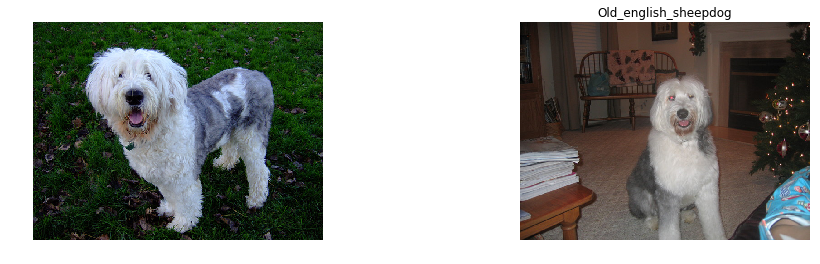

Actual Breed: jpg

Predicted Breed: Old_english_sheepdog





Dog detected


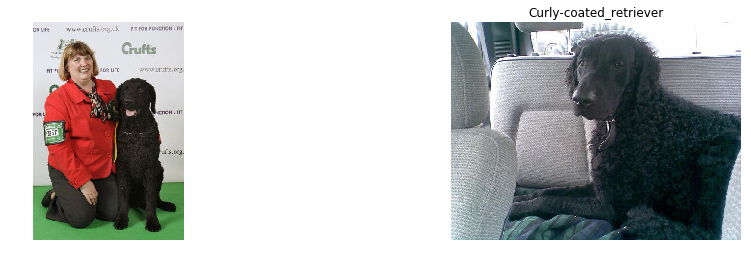

Actual Breed: jpg

Predicted Breed: Curly-coated_retriever





Dog detected


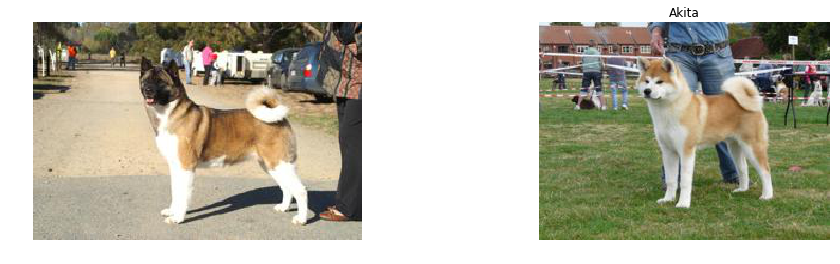

Actual Breed: jpg

Predicted Breed: Akita





Dog detected


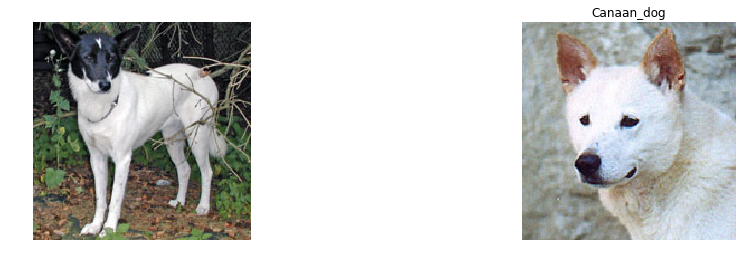

Actual Breed: jpg

Predicted Breed: Canaan_dog





Dog detected


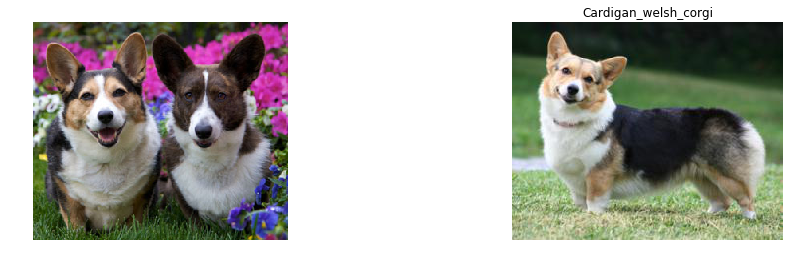

Actual Breed: jpg

Predicted Breed: Cardigan_welsh_corgi







In [51]:
# Create list of test image paths
test_img_paths = sorted(glob('dogImages/test/*/*'))
# Shuffle the list and display first few rows
np.random.shuffle(test_img_paths)
test_img_paths[1:5]

for img_path in test_img_paths[0:5]:
    display_predictions(img_path)

---
<a id='step5'></a>
## Step 5: Write your Algorithm

Write an algorithm that accepts a file path to an image and first determines whether the image contains a human, dog, or neither.  Then,
- if a __dog__ is detected in the image, return the predicted breed.
- if a __human__ is detected in the image, return the resembling dog breed.
- if __neither__ is detected in the image, provide output that indicates an error.

You are welcome to write your own functions for detecting humans and dogs in images, but feel free to use the `face_detector` and `human_detector` functions developed above.  You are __required__ to use your CNN from Step 4 to predict dog breed.  

Some sample output for our algorithm is provided below, but feel free to design your own user experience!

![Sample Human Output](images/sample_human_output.png)


### (IMPLEMENTATION) Write your Algorithm

In [64]:
### TODO: Write your algorithm.
### Feel free to use as many code cells as needed.
def run_app(img_path):
    '''
    Params:
        img_path: image path
    '''
    is_human = face_detector(img_path)
    is_dog = dog_detector(img_path)
    pred_index, breed, name = predict_breed_transfer(img_path)
    
    fig = plt.figure(figsize=(20, 5))
    
    if is_human:
        print('Hello, human!')
    elif is_dog:
        print('Hello, dog!')
    else:
        print('Error: Neither human nor dog is detected.')
        ax = fig.add_subplot(1,2,1)
        img = mpimg.imread(img_path)
        ax.imshow(img)
        plt.axis('off')
        plt.show()
        return
    ax = fig.add_subplot(1, 2, 1)
    img = mpimg.imread(img_path)
    ax.imshow(img)
    plt.axis('off')
    plt.show() 
    print(f'You look like a {breed}.\n\n')
    print("#" * 20)

---
<a id='step6'></a>
## Step 6: Test Your Algorithm

In this section, you will take your new algorithm for a spin!  What kind of dog does the algorithm think that _you_ look like?  If you have a dog, does it predict your dog's breed accurately?  If you have a cat, does it mistakenly think that your cat is a dog?

### (IMPLEMENTATION) Test Your Algorithm on Sample Images!

Test your algorithm at least six images on your computer.  Feel free to use any images you like.  Use at least two human and two dog images.  

__Question 6:__ Is the output better than you expected :) ?  Or worse :( ?  Provide at least three possible points of improvement for your algorithm.

__Answer:__ (Three possible points for improvement)

The output is better than I expected. I thought the accuracy of tranfer learning based method would somewhere around 70%.

The possible ways to improve the algorithm:

 1. Use cnn_dector to distinguish dog and human
 2. More various way of data augmentation, for example, changing some of the images to grey scale images (but still with 3 channels)
 3. Use another pre-chained model

Hello, human!


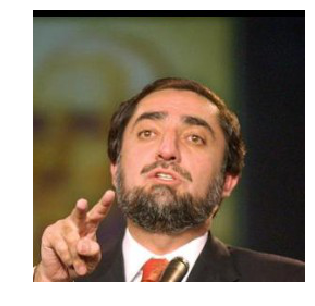

You look like a Field_spaniel.


####################
Hello, human!


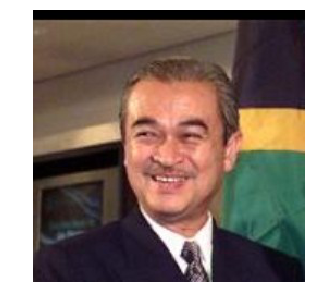

You look like a Cavalier_king_charles_spaniel.


####################
Hello, human!


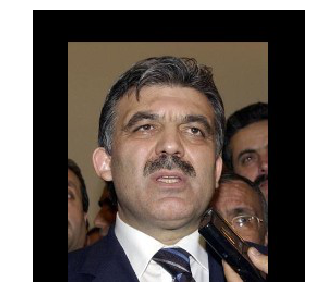

You look like a Cavalier_king_charles_spaniel.


####################
Hello, dog!


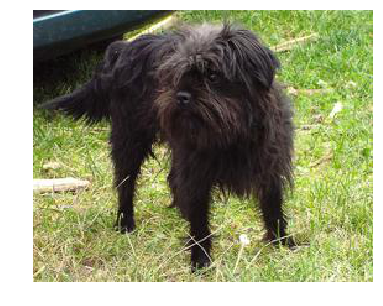

You look like a Affenpinscher.


####################
Hello, dog!


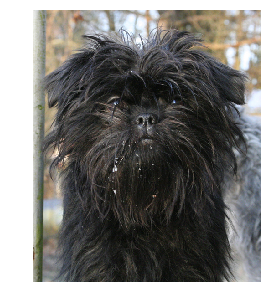

You look like a Affenpinscher.


####################
Hello, dog!


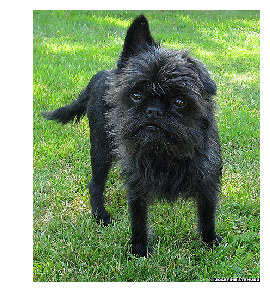

You look like a Affenpinscher.


####################


In [65]:
## TODO: Execute your algorithm from Step 6 on
## at least 6 images on your computer.
## Feel free to use as many code cells as needed.

## suggested code, below
for file in np.hstack((human_files[:3], dog_files[:3])):
    run_app(file)